We want to show the Electric, Magnetic, and Pixel Intensity from Swarm B

In [716]:
import numpy as np #Lets handle our imports now for section A
import matplotlib.pyplot as plt
import asilib
import asilib.asi
from datetime import datetime, timedelta
from scipy.optimize import curve_fit
from viresclient import set_token
from viresclient import SwarmRequest
import geopack.geopack as gp

import scienceplots

plt.style.use(['science','no-latex'])
alt=150

In [717]:
time_array=(datetime(2022,12,19,14,2), datetime(2022,12,19,14,8))

In [718]:
#From documentation link
def requester(sc_collection, measurement, residual, sampling_step=None, **kwargs):
    try:
        request = SwarmRequest()
        request.set_collection(sc_collection)
        if residual == True:
            request.set_products(
                measurements=measurement,
                models=["CHAOS"],
                residuals=True,
                sampling_step=sampling_step,
            )
        else:
            request.set_products(
                measurements=measurement,
                models=["CHAOS"],
                sampling_step=sampling_step,
            )
        data = request.get_between(datetime(2022,12,19,14,4), datetime(2022,12,19,14,6), **kwargs) #sets to get data between the first and last value in the time tuple
        df = data.as_dataframe()
    except:
        df = []
    return df

In [719]:
def arrangement(time, array, shape):  # arranges B into a useable format for use later
    barranged = np.zeros((len(time), shape))
    # Re-arranges into proper (n x 3 ) matricies, ugly but works
    for j in range(len(time)):
        for k in range(shape):
            barranged[j][k] = array[j][k]
    return barranged

In [720]:
def unit_array(array):
    arraysum = np.sum(np.abs(array), axis=1)
    # Normalizes and finds unitary
    array_unit = array / arraysum[:, np.newaxis]  # normalizes
    return array_unit

In [721]:
#Lets do B first
ds = requester( 
    "SW_OPER_MAGB_HR_1B", #Mag B, high resolution, 50Hz B (Magnetic field)
    "B_NEC", #Magnetic field in NEC coordinates
    True, 
    asynchronous=False,
    show_progress=False) 
print(ds)
BNEC=ds["B_NEC_res_CHAOS"]
Btime = BNEC.index.to_numpy()
BNEC = arrangement(Btime, ds["B_NEC_res_CHAOS"], 3)




                                Latitude      Radius  \
Timestamp                                              
2022-12-19 14:04:00.010546923  65.407503  6872238.82   
2022-12-19 14:04:00.030546904  65.406239  6872238.96   
2022-12-19 14:04:00.050546885  65.404975  6872239.10   
2022-12-19 14:04:00.070546865  65.403711  6872239.25   
2022-12-19 14:04:00.090546846  65.402447  6872239.39   
...                                  ...         ...   
2022-12-19 14:05:59.902414083  57.822759  6873210.19   
2022-12-19 14:05:59.922414064  57.821493  6873210.37   
2022-12-19 14:05:59.942414045  57.820226  6873210.54   
2022-12-19 14:05:59.962414026  57.818960  6873210.72   
2022-12-19 14:05:59.982414007  57.817694  6873210.90   

                                                                 B_NEC_res_CHAOS  \
Timestamp                                                                          
2022-12-19 14:04:00.010546923  [82.78851767348624, -138.16134622453387, 36.38...   
2022-12-19 14:04:00

C:\Users\1101w\AppData\Local\Temp\ipykernel_14124\2246279540.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  barranged[j][k] = array[j][k]


In [722]:
from scipy.spatial.transform import Rotation as R
import numpy as np

def quaternion_inverse_scipy(q):
    # Ensure q is a numpy array
    q = np.asarray(q)
    
    # Create a Rotation object from the quaternion
    rotation = R.from_quat(q)  # Note: scipy uses [x, y, z, w] format
    
    # Compute the inverse rotation
    inverse_rotation = rotation.inv()
    
    
    return inverse_rotation

In [723]:

def find_closest_indices(times1, times2):
    # Convert to numpy arrays
    times1 = np.array(times1)
    times2 = np.array(times2)
    
    # Compute the differences between each time in times1 and all times in times2
    # Resulting in a 2D array where each row contains the absolute differences for one time in times1
    differences = np.abs(times1[:, None] - times2)
    
    # Find the index of the minimum difference for each time in times1
    closest_indices = np.argmin(differences, axis=1)
    
    return closest_indices

In [724]:
from datetime import datetime, timedelta
from scipy.optimize import curve_fit
import geopack.geopack as gp
def footprint(time, latitude, longitude, altitude, alt,vsw= [-400,0,0]):
    """
    time, datetime, time for magnetic data for footprint
    vsw velocity of solar wind, tuple of x,y,z
    longitude of satellite in degrees
    latitude of satellite in degrees
    altitude of satellite in km from centre of earth (should be above ~6371)
    THIS CODE ONLY Works in the NOrthern hemisphere

    """
    def cubic(t, a, b, c, d):
            return a*t**3 + b*t**2 + c*t + d
    def x(t, params_x):
        return cubic(t, *params_x)

    def y(t, params_y):
        return cubic(t, *params_y)

    def z(t, params_z):
        return cubic(t, *params_z)
    def radius(t, params_x, params_y, params_z):
        return np.sqrt(x(t, params_x)**2 + y(t, params_y)**2 + z(t, params_z)**2)
    
    def curve_fit_func(xx,yy,zz, differencealt):
        
        r = np.linspace(1, 1.5, 100000)# construct an array of radiuses from 1-1.5

        radius_data=np.sqrt(xx**2+yy**2+zz**2)

        params_x, _ = curve_fit(cubic, radius_data, xx) #Constructs fits on the traces inward since the spatial resolution produced by geopack is limited.
        params_y, _ = curve_fit(cubic, radius_data, yy)
        params_z, _ = curve_fit(cubic, radius_data, zz)

        

        index_closest=np.argmin(np.abs(radius(r, params_x, params_y, params_z)-(alt-differencealt+6371)/6371))#Find the index that produces the closest radius to the altitude

        return x(r[index_closest],params_x ),y(r[index_closest],params_y ),z(r[index_closest],params_z )
    
    t1 = time
    t0 = datetime(1970,1,1) #epoch
    ut = (t1-t0).total_seconds()
    lat_sat=np.deg2rad(latitude)
    lon_sat=np.deg2rad(longitude) #converts to radii
    gp.recalc(ut)
    r, theta= gp.geodgeo(altitude,lat_sat,1) #this r accounts for earths oblateness, so we need to find the difference between my 6371 assumption and the real value and account for that
    differencearray= (altitude+6371)-r
    x_gc,y_gc,z_gc = gp.sphcar((r)/6371,theta,lon_sat,1)  #spherical to cartesian
    

    x_gsm, y_gsm, z_gsm = gp.geogsm(x_gc,y_gc,z_gc, 1) #cartesian to gsm

    x_foot,y_foot,z_foot=np.zeros(len(x_gsm)), np.zeros(len(y_gsm)), np.zeros(len(z_gsm)) #initalize an array
    for index in range(len(x_gsm)):
        x_foot_int, y_foot_int, z_foot_int, xx, _,zz = gp.trace(x_gsm[index], y_gsm[index], z_gsm[index], dir=1,rlim=1.6, maxloop=3000 ) #traces each set of lat,lon,alt outward
        _, _, _, xx2,yy2,zz2 = gp.trace(x_foot_int, y_foot_int, z_foot_int, dir=-1,rlim=100, maxloop=1000 )#Traces inward

        x_foot[index],y_foot[index],z_foot[index] = curve_fit_func(xx2,yy2,zz2, differencearray[index])


            

    x_done, y_done, z_done = gp.geogsm(x_foot, y_foot, z_foot, -1)

    alt_sat_done, lat_sat_done,lon_sat_done = np.zeros(len(x_done)), np.zeros(len(x_done)), np.zeros(len(x_done))
    for index in range(len(x_done)):
        
        r_done,theta_done,lon_sat_done[index]= gp.sphcar(x_done[index], y_done[index], z_done[index],-1)

        alt_sat_done[index], lat_sat_done[index]= gp.geodgeo(r_done*6371,theta_done,-1) #TODO check if this is right

    print(alt_sat_done, 'altitude derived from fit')

    if np.any(np.abs(alt_sat_done - alt) > 5):
        raise Exception("One or more values in the footprinting are greater than 5km away from the specified alt. Contact owner for a fix, not your fault")
    print(np.rad2deg(lon_sat_done)-360,np.rad2deg(lat_sat_done) , 'lat and lon' )
    sat_lla=np.array([ np.rad2deg(lat_sat_done), np.rad2deg(lon_sat_done)-360,  alt_sat_done])
    return sat_lla

In [725]:
measurements_E = [
        "VsatN",
        "VsatE",
        "VsatC",
        "Evx",
        "Evy",
        "Evz",
        "Vixv",
        "Viy",
        "Viz",
        "Quality_flags",
    ]
ds = requester( 
    "SW_EXPT_EFIB_TCT16", #Mag B, high resolution, 50Hz B (Magnetic field)
    measurements_E, #Magnetic field in NEC coordinates
    True, 
    asynchronous=False,
    show_progress=False) 
print(ds)
dsB = requester( 
    'SW_OPER_MAGB_HR_1B', #Mag B, high resolution, 50Hz B (Magnetic field)
    ["q_NEC_CRF"], #Magnetic field in NEC coordinates
    False, 
    asynchronous=False,
    show_progress=False)

latitude, longitude, altitude = dsB['Latitude'].to_numpy(), dsB['Longitude'].to_numpy(),  (dsB["Radius"].to_numpy()-6.371e6)/1e3 #km  # Gets Emphermis data


                                    Evz   Latitude         Vixv         Viz  \
Timestamp                                                                     
2022-12-19 14:04:00.006750107  8.471214  65.467339  -971.565735   41.156399   
2022-12-19 14:04:00.068749905  8.235891  65.463417  -975.420593   20.354244   
2022-12-19 14:04:00.131750107  8.086688  65.459442 -1122.846069   55.447094   
2022-12-19 14:04:00.193749905  8.649044  65.455521 -1011.071106   44.507736   
2022-12-19 14:04:00.256750107  9.233665  65.451538 -1027.526855 -116.582336   
...                                 ...        ...          ...         ...   
2022-12-19 14:05:59.693749905 -1.469386  57.895660  -412.020325   47.678398   
2022-12-19 14:05:59.756750107 -1.843340  57.891670  -431.216309   49.343391   
2022-12-19 14:05:59.818749905 -2.056162  57.887745  -411.504822    7.718913   
2022-12-19 14:05:59.881750107 -2.261700  57.883759  -476.185181  115.148308   
2022-12-19 14:05:59.943749905 -1.519680  57.879833  

In [726]:
sat_lla_B=footprint(time_array[0], latitude, longitude, altitude, alt, vsw=[-345,12,-12])


[150.10593796 150.10559336 150.1370933  ... 150.2225026  150.22208913
 150.22166512] altitude derived from fit
[-117.84339792 -117.84318696 -117.84300528 ... -116.97064547 -116.97054922
 -116.97045295] [65.84075831 65.83952831 65.83825947 ... 58.48075142 58.47952818
 58.47830491] lat and lon


In [727]:
print(sat_lla_B)

[[  65.84075831   65.83952831   65.83825947 ...   58.48075142
    58.47952818   58.47830491]
 [-117.84339792 -117.84318696 -117.84300528 ... -116.97064547
  -116.97054922 -116.97045295]
 [ 150.10593796  150.10559336  150.1370933  ...  150.2225026
   150.22208913  150.22166512]]


In [728]:
indicies=find_closest_indices(ds.index, dsB.index)
quatnecrf=dsB["q_NEC_CRF"].to_numpy()[indicies]
quaternions = []
Esat=np.array([ds["Evx"] , ds["Evy"], ds["Evz"]]).T
vsat=np.array([ds["Vixv"] , ds["Viy"], ds["Viz"]]).T
Etime = ds.index
ENEC=[]
VNEC=[]
for i in range(len(quatnecrf)):
    inverse_quat = quaternion_inverse_scipy(dsB["q_NEC_CRF"].to_numpy()[indicies][i])
    rot_NEC_V= inverse_quat.apply(Esat[i])
    ENEC.append(rot_NEC_V)

    rot_NEC_V= inverse_quat.apply(vsat[i])
    VNEC.append(rot_NEC_V)

ENEC=np.array(ENEC)
VNEC=np.array(VNEC)


Now for the hard part, the pixel intensity
Since the satellite as seen in figure 1 passes through the arc pretty fast, we should increase the resolution of the pixel intensity by super imposing 

Lets define the imager

In [729]:
from scipy.interpolate import CubicSpline
cs_lat = CubicSpline( Btime, sat_lla_B[0])
cs_lon = CubicSpline( Btime, sat_lla_B[1])
cs_alt = CubicSpline( Btime, sat_lla_B[2])
print(ds['Latitude'].to_numpy())
print(latitude)
sat_lla_E= np.array([cs_lat(Etime), cs_lon(Etime),  cs_alt(Etime)]) #km  # Gets Emphermis data latitude, longitude, altitude


[65.46734  65.46342  65.45944  ... 57.887745 57.88376  57.879833]
[65.4075031 65.406239  65.4049749 ... 57.8202265 57.8189604 57.8176943]


In [730]:
asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt,   time_range=time_array, colors='r')


In [731]:

#sat_lla_E=footprint(time_array[0],latitude_E, longitude_E, altitude_E, alt, vsw=[-345,12,-12])

conjunction_obj = asilib.Conjunction(asi, (np.array(Etime), sat_lla_E.T))

In [732]:
#Now lets 

c:\Users\1101w\anaconda3\envs\pymc_env\Lib\site-packages\asilib\conjunction.py:425: UserWarning: Some latitude or longitude values are outside of the skymap lat/lon arrays or are invalid. The equal area mask will be all NaNs.
  warnings.warn(


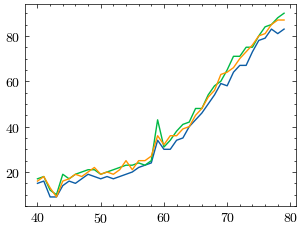

In [733]:
sat_azimuth_elevation, sat_azel_pixels = conjunction_obj.map_azel()
area_intensity = conjunction_obj.intensity()
area_mask = conjunction_obj.equal_area(box=(10,10))
# Need to change masked NaNs to 0s so we can plot the rectangular area contours.
area_mask[np.where(np.isnan(area_mask))] = 0
plt.plot(area_intensity) #This gives us a resolution of 3Hz.


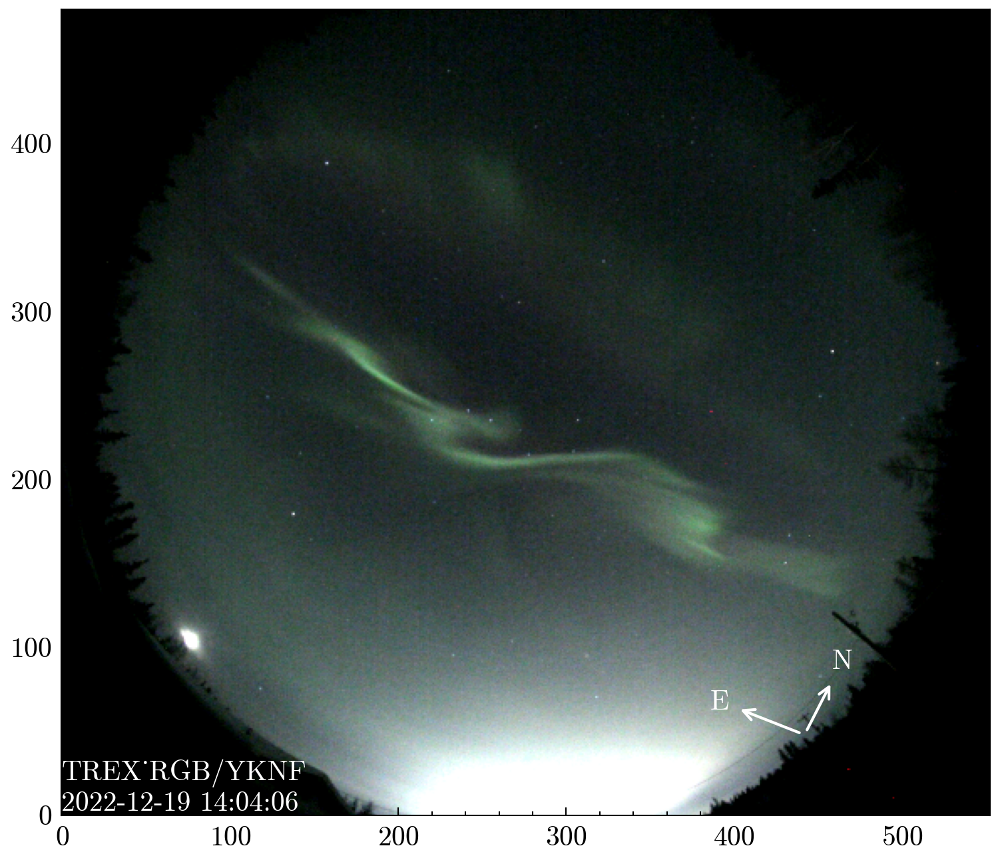

In [734]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
asi_single=asilib.asi.trex_rgb(location_code='yknf', alt=alt,  time=datetime(2022,12,19,14,4,5), colors='rgb')

ax, im_good = asi_single.plot_fisheye(ax=ax)


[[-118.50009  -118.50009  -118.50009  ... -118.50009  -118.50009
  -118.50009 ]
 [-118.50009  -118.50009  -118.50009  ... -119.98486  -119.98486
  -119.98486 ]
 [-118.08197  -118.08197  -118.08197  ... -120.369446 -120.369446
  -120.369446]
 ...
 [-105.23822  -105.23822  -105.23822  ... -111.73367  -111.73367
  -111.73367 ]
 [-105.41092  -105.41092  -105.41092  ... -111.4859   -111.4859
  -111.4859  ]
 [-105.076416 -105.076416 -105.076416 ... -105.076416 -105.076416
  -105.076416]]


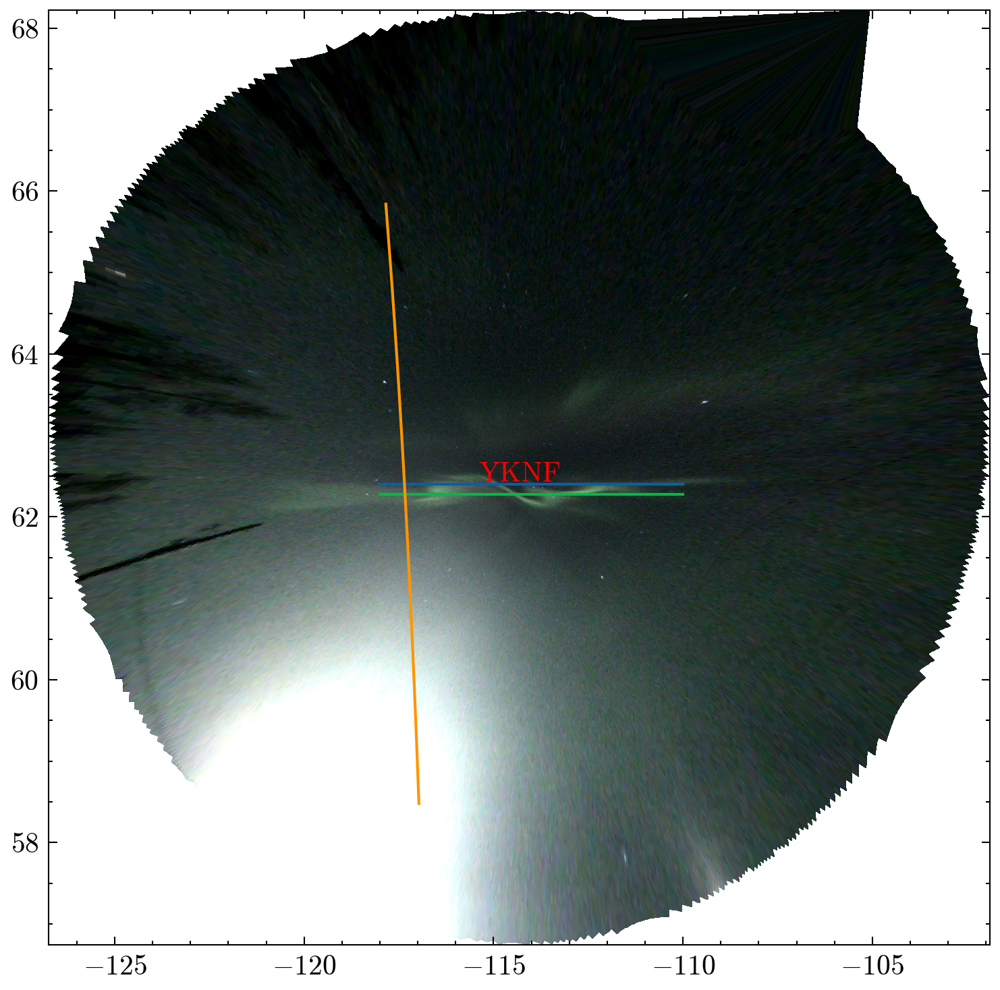

In [735]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
ax, im_good = asi_single.plot_map(ax=ax)
coords=im_good.get_coordinates()
x_coords=coords[:,:,0]
y_coords=coords[:,:,1]
print(x_coords)
x = np.linspace(-118, -110, 200)
y= np.linspace(62.4, 62.4, 200)
plt.plot(x,y)
y= np.linspace(62.28, 62.28, 200)
plt.plot(x,y)

plt.plot(sat_lla_E[1], sat_lla_E[0])


In [736]:


# grid_lats, grid_lons: 2D arrays representing the latitude and longitude grid
# line_lats, line_lons: 1D arrays representing the latitude and longitude of the line

def find_closest_grid_points(grid_lats, grid_lons, line_lats, line_lons):
    # Reshape line_lats and line_lons for broadcasting with the grid
    line_lats_reshaped = line_lats[:, np.newaxis, np.newaxis]  # Shape: (num_points, 1, 1)
    line_lons_reshaped = line_lons[:, np.newaxis, np.newaxis]  # Shape: (num_points, 1, 1)

    # Compute squared Euclidean distances using broadcasting
    lat_diff = grid_lats[np.newaxis, :, :] - line_lats_reshaped  # Shape: (num_points, grid_lat_dim, grid_lon_dim)
    lon_diff = grid_lons[np.newaxis, :, :] - line_lons_reshaped  # Shape: (num_points, grid_lat_dim, grid_lon_dim)
    distances = lat_diff**2 + lon_diff**2  # Shape: (num_points, grid_lat_dim, grid_lon_dim)

    # Find the flat index of the minimum distance for each point along the grid axes
    min_indices_flat = np.argmin(distances.reshape(distances.shape[0], -1), axis=1)  # Shape: (num_points,)

    # Convert flat indices back to 2D grid indices for all points at once
    grid_shape = grid_lats.shape
    closest_indices = np.stack(np.unravel_index(min_indices_flat, grid_shape), axis=1)

    return closest_indices.T

# Example usage
grid_lats = np.array(y_coords)  # Replace y_coords with the actual grid latitude array (2D)
grid_lons = np.array(x_coords)  # Replace x_coords with the actual grid longitude array (2D)

line_lats = np.array(y)         # Replace y with the actual line latitude array (1D)
line_lons = np.array(x)         # Replace x with the actual line longitude array (1D)

closest_indices = find_closest_grid_points(grid_lats, grid_lons, line_lats, line_lons)
print(closest_indices)


[[153 153 153 153 154 154 154 154 155 155 156 156 156 157 156 158 157 158
  158 159 160 159 160 160 161 161 161 162 162 163 164 164 165 166 165 166
  166 168 168 169 169 170 170 170 172 172 172 174 174 174 175 176 177 177
  178 179 180 181 182 182 183 184 185 186 186 187 188 189 190 191 192 192
  194 195 196 197 198 198 200 201 202 203 204 205 206 207 208 209 211 211
  212 214 215 216 217 218 219 220 222 223 224 225 226 227 229 230 230 232
  233 234 235 236 238 239 240 241 242 243 244 245 246 247 248 249 250 251
  253 254 254 255 257 258 258 260 260 261 263 263 265 265 267 267 268 269
  270 270 271 273 273 274 275 275 276 277 277 278 279 280 281 282 283 283
  283 284 285 286 287 287 288 289 289 290 290 291 291 292 294 294 295 295
  295 296 296 298 298 298 298 300 300 300 301 302 302 302 304 304 304 305
  305 305]
 [424 423 422 421 420 419 418 417 416 415 414 413 412 411 409 409 407 406
  405 404 403 401 400 399 398 396 395 394 392 391 390 388 387 386 384 383
  381 380 378 377 375 374 3

In [737]:
print(grid_lons[closest_indices[0], closest_indices[1] ])

[-117.99835  -117.96097  -117.92407  -117.887695 -117.83252  -117.79727
 -117.76245  -117.72809  -117.67584  -117.64249  -117.5918   -117.55942
 -117.527405 -117.4787   -117.43356  -117.40027  -117.35632  -117.310425
 -117.28113  -117.23645  -117.192505 -117.15173  -117.10901  -117.081726
 -117.04007  -116.98712  -116.961    -116.92108  -116.8703   -116.831604
 -116.793396 -116.74484  -116.707825 -116.671265 -116.63739  -116.601685
 -116.55621  -116.50934  -116.46524  -116.43161  -116.38867  -116.355896
 -116.313995 -116.272705 -116.23007  -116.18988  -116.15021  -116.10922
 -116.070496 -116.03229  -115.98425  -115.955444 -115.90857  -115.87213
 -115.826355 -115.78119  -115.75409  -115.70984  -115.66611  -115.63202
 -115.5892   -115.546844 -115.504944 -115.4635   -115.43106  -115.39032
 -115.349915 -115.30994  -115.27026  -115.23093  -115.191895 -115.145966
 -115.09958  -115.06152  -115.02368  -114.986084 -114.94867  -114.90442
 -114.85986  -114.82312  -114.78656  -114.75012  -114.6994

In [738]:
print(grid_lats[closest_indices[1], closest_indices[0] ])

[64.20729  64.176346 64.14607  64.116455 64.085304 64.05711  64.02951
 64.00247  63.974575 63.948776 63.92244  63.89779  63.873608 63.84931
 63.803757 63.80316  63.759216 63.73777  63.716732 63.69638  63.67661
 63.636707 63.618202 63.599358 63.581745 63.545673 63.528046 63.511948
 63.478123 63.463066 63.448383 63.416676 63.402905 63.38946  63.357693
 63.344994 63.31627  63.306454 63.278942 63.267708 63.241222 63.230602
 63.205067 63.18007  63.172928 63.14883  63.12521  63.119034 63.096203
 63.07379  63.054665 63.046738 63.02834  63.007393 62.989815 62.972633
 62.965725 62.949123 62.93287  62.913788 62.898163 62.882843 62.867813
 62.853058 62.83528  62.821026 62.80701  62.793224 62.77966  62.7663
 62.753143 62.728645 62.719357 62.70682  62.69445  62.682236 62.670166
 62.647106 62.638855 62.627247 62.615757 62.604378 62.585754 62.574635
 62.563606 62.545464 62.53465  62.523914 62.516804 62.495605 62.485104
 62.478237 62.467857 62.450592 62.44033  62.43011  62.413055 62.402924
 62.39642  

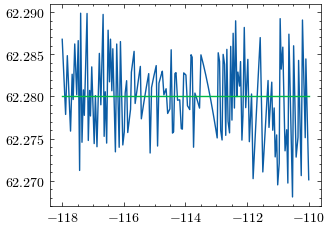

In [739]:
#plt.plot(line_lons, line_lats)
plt.plot(grid_lons[closest_indices[0], closest_indices[1] ],grid_lats[closest_indices[0], closest_indices[1] ] )
plt.plot( line_lons, line_lats)

In [ ]:
import numpy as np
from datetime import timedelta

# Define the coordinates for y values
x_1 = np.linspace(-119, -107, 500)  # x-coordinates (longitude range)
y_values = np.array([62.28, 62.32, 62.36, 62.40])  # y-values for different lines (latitude)
y_target = np.tile(y_values[:, np.newaxis], (1, 500))  # 2D array of shape (4, 800)

# Initialize ASI object
asi = asilib.asi.trex_rgb(location_code='yknf', alt=alt ,  time_range=(time_array[0], time_array[-1]))

# Lists to hold results
pixel_closest_list = np.zeros((4, 120, 500, 3), dtype=np.uint8)
time_ewo = []

movie_generator = asi.animate_map_gen()
closest_indices = []
for i, (time, image, _, im) in enumerate(movie_generator):
    if i ==0:
        coords = im.get_coordinates()
        grid_lons = coords[:, :, 0]
        grid_lats = coords[:, :, 1]
        # Loop over each y-value target line
        for j in range(len(y_values)):
            # Get closest grid points for all 800 points on the line
            closest_indices.append(np.transpose(find_closest_grid_points(grid_lats, grid_lons, y_target[j], x_1))) 
            
            # Ensure closest_indices has shape (800, 2) where 800 points correspond to x_1
            # closest_indices[0] = indices of closest grid points for latitudes
            # closest_indices[1] = indices of closest grid points for longitudes

            if closest_indices[j].shape[0] == 500:
                # Fetch the RGB values for all 800 closest grid points using advanced indexing
                pixel_values = image[closest_indices[j][:, 0], closest_indices[j][:, 1], :]  # shape (800, 3)
                
                # Append all pixel values for this y-value line
                pixel_closest_list[j][i] = pixel_values
            else:
                print(f"Error: closest_indices does not match the expected shape for y_value index {j}")
    else:
         for j in range(len(y_values)):
            # Get closest grid points for all 800 points on the line
            
            # Ensure closest_indices has shape (800, 2) where 800 points correspond to x_1
            # closest_indices[0] = indices of closest grid points for latitudes
            # closest_indices[1] = indices of closest grid points for longitudes

            if closest_indices[j].shape[0] == 500:
                # Fetch the RGB values for all 800 closest grid points using advanced indexing
                pixel_values = image[closest_indices[j][:, 0], closest_indices[j][:, 1], :]  # shape (800, 3)
                
                # Append all pixel values for this y-value line
                pixel_closest_list[j][i] = pixel_values
            else:
                print(f"Error: closest_indices does not match the expected shape for y_value index {j}")


    time_ewo.append(time)
    if i==119:
        break

# Unpack the pixel closest lists for each y-value
pixel_closest_30, pixel_closest_32, pixel_closest_34, pixel_closest_36 = pixel_closest_list


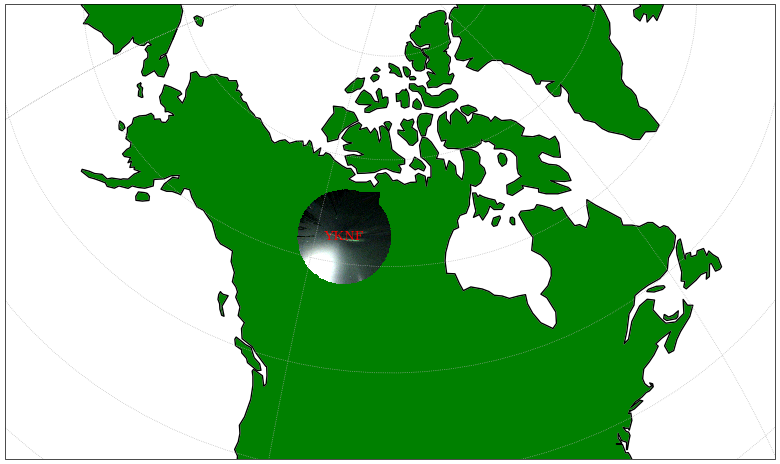

In [694]:
import numpy as np
from datetime import timedelta

# Initialize ASI object
asi = asilib.asi.trex_rgb(location_code='yknf', alt=alt ,   time_range=(datetime(2022,12,19,14,4), datetime(2022,12,19,14,6)))

indicies_sat=[]
pixel_closest_sat = np.zeros((40, 1920, 3), dtype=np.uint8)
movie_generator = asi.animate_map_gen()
time_sat_keo = []
for i, (time, image, _, im) in enumerate(movie_generator): 
    indicies_sat.append(np.where((Etime >= np.datetime64(time)) & (Etime <= np.datetime64(time + timedelta(seconds=3))))[0])
    if i ==0:
        coords = im.get_coordinates()
        grid_lons = coords[:, :, 0]
        grid_lats = coords[:, :, 1]
        closest_indices_sat = np.transpose(find_closest_grid_points(grid_lats, grid_lons, sat_lla_E[0], sat_lla_E[1]))
        pixel_closest_sat[i] = ( image[closest_indices_sat[:, 0], closest_indices_sat[:, 1], :])
    else:
         pixel_closest_sat[i] = ( image[closest_indices_sat[:, 0], closest_indices_sat[:, 1], :])
    time_sat_keo.append(time)
    if i==39:
        break




[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24| 2%
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48]
[array([[15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [15, 17, 17],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [17, 19, 20],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [13, 16, 13],
       [14, 14, 13],
       

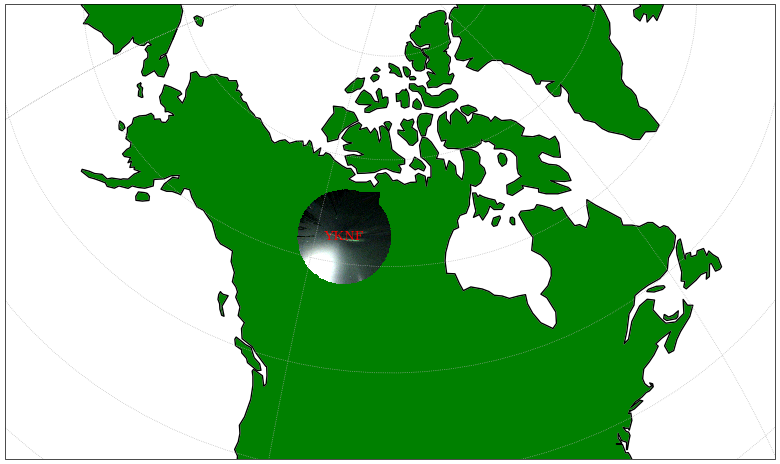

In [695]:


# Initialize ASI object
asi = asilib.asi.trex_rgb(location_code='yknf', alt=alt,   time_range=(datetime(2022,12,19,14,4), datetime(2022,12,19,14,6)))


pixel_closest_sat_track = []
movie_generator = asi.animate_map_gen()
time_sat_alongtrack = []
lats=[]
for i, (time, image, _, im) in enumerate(movie_generator): 
    indicies = np.where((Etime >= np.datetime64(time)) & (Etime <= np.datetime64(time + timedelta(seconds=3))))[0]
    print(indicies)
    coords = im.get_coordinates()
    grid_lons = coords[:, :, 0]
    grid_lats = coords[:, :, 1]
    closest_indices_sat = np.transpose(find_closest_grid_points(grid_lats, grid_lons, sat_lla_E[0][indicies], sat_lla_E[1][indicies]))
    lats.append(sat_lla_E[0][indicies])
    pixel_closest_sat_track.append( image[closest_indices_sat[:, 0], closest_indices_sat[:, 1], :])
    print(pixel_closest_sat_track)
    if i==39:
        break



(120, 500, 3)
[[[28 33 32]
  [28 33 32]
  [27 31 31]
  ...
  [17 20 19]
  [17 20 19]
  [18 19 17]]

 [[29 31 29]
  [29 31 29]
  [29 32 31]
  ...
  [17 21 19]
  [17 21 19]
  [15 21 18]]

 [[28 33 30]
  [28 33 30]
  [27 32 29]
  ...
  [19 20 19]
  [19 20 19]
  [18 20 19]]

 ...

 [[27 29 26]
  [27 29 26]
  [26 29 29]
  ...
  [16 17 16]
  [16 17 16]
  [17 21 20]]

 [[26 30 28]
  [26 30 28]
  [25 29 27]
  ...
  [17 18 18]
  [17 18 18]
  [17 19 17]]

 [[28 31 28]
  [28 31 28]
  [27 28 27]
  ...
  [16 20 20]
  [16 20 20]
  [17 18 22]]]


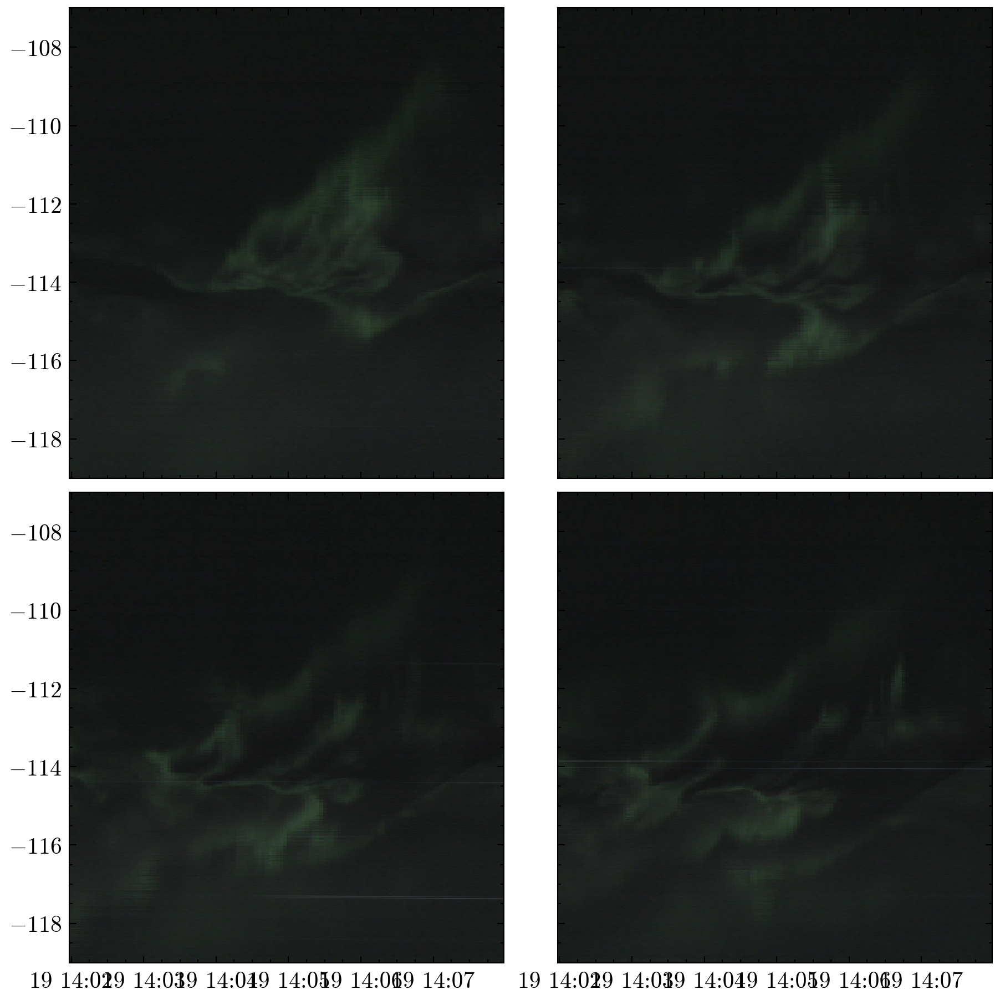

In [696]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300, nrows=2,ncols=2, constrained_layout=True, sharex=True, sharey=True)
print(np.shape(pixel_closest_30))
print(pixel_closest_30)
ax[0][0].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_30, 1, 0 ))
ax[0][1].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_32, 1, 0 ))
ax[1][0].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_34, 1, 0 ))
ax[1][1].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_36, 1, 0 ))

Distance: 67.49 km
Time: 90.0 s
Velocity: 0.7498958098930414
Distance: 75.18 km
Time: 90.0 s
Velocity: 0.8353089353458863
Distance: 108.73 km
Time: 115.0 s
Velocity: 0.9454867705822165
Distance: 113.76 km
Time: 115.0 s
Velocity: 0.9891868623024784


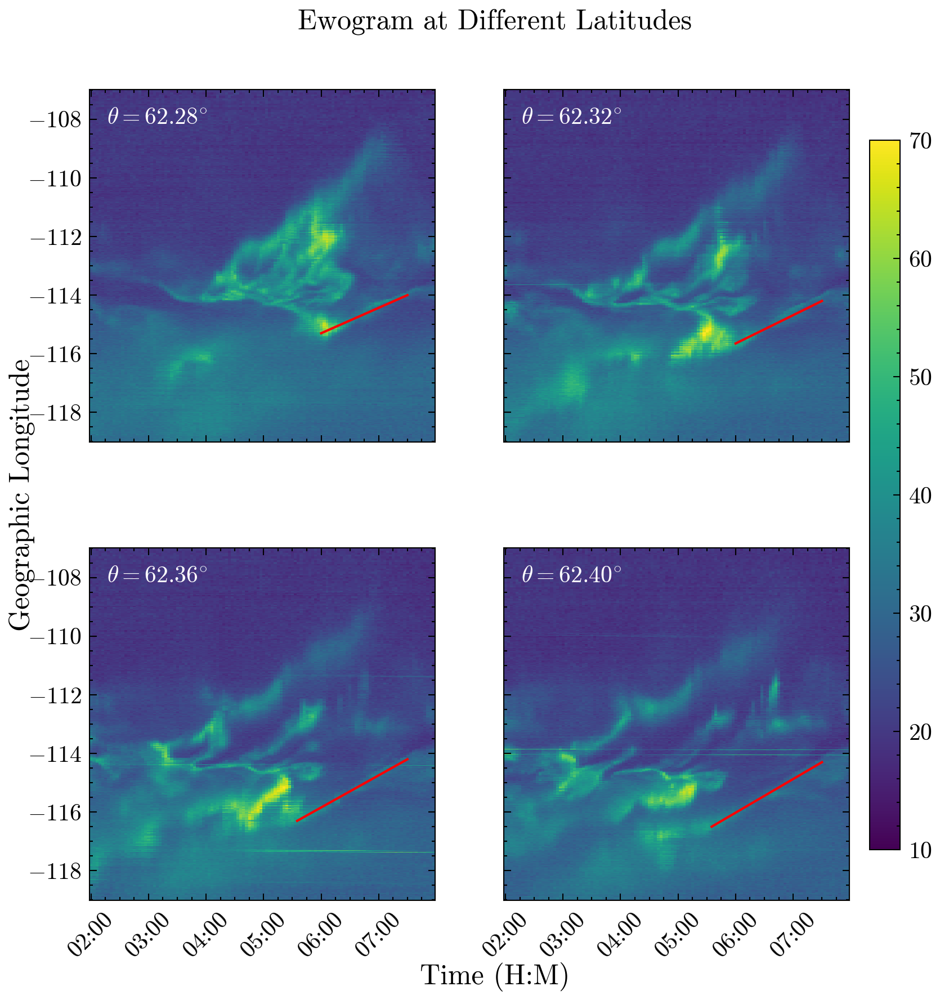

In [697]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
from geopy.distance import geodesic

fig, ax = plt.subplots(figsize=(6, 6), dpi=300, nrows=2, ncols=2, sharex=True, sharey=True)

# Plotting the pcolormesh for each subplot
ax[0][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_30, 1, 0)[:, :, 1], vmin=10, vmax=70)
ax[0][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_32, 1, 0)[:, :, 1], vmin=10, vmax=70)
ax[1][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_34, 1, 0)[:, :, 1], vmin=10, vmax=70)
im = ax[1][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_36, 1, 0)[:, :, 1], vmin=10, vmax=70)

# Adding a color bar
fig.subplots_adjust(left=0.1, right=0.85, top=0.9, bottom=0.1, hspace=0.3, wspace=0.2)  # Adjust spacing
cbar_ax = fig.add_axes([0.87, 0.15, 0.03, 0.7])  # Adjust colorbar position
fig.colorbar(im, cax=cbar_ax)

# Formatting the x-axis with minutes and seconds
locator = mdates.MinuteLocator(interval=1)  # Shows every minute
formatter = mdates.DateFormatter('%M:%S')  # Format to show minutes:seconds

for axes in ax.flat:
    axes.xaxis.set_major_locator(locator)
    axes.xaxis.set_major_formatter(formatter)
    axes.tick_params(axis='x', rotation=45)

# Adding title and labels
fig.suptitle("Ewogram at Different Latitudes")
fig.supxlabel(r"Time (H:M)")
fig.supylabel(r"Geographic Longitude")

# Adding latitude text to the top left of each subplot
latitudes = [62.28, 62.32, 62.36, 62.40]
ax[0][0].text(0.05, 0.95, f"$\\theta={latitudes[0]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][0].transAxes, color='white')
ax[0][1].text(0.05, 0.95, f"$\\theta={latitudes[1]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][1].transAxes, color='white')
ax[1][0].text(0.05, 0.95, f"$\\theta={latitudes[2]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][0].transAxes, color='white')
ax[1][1].text(0.05, 0.95, f"$\\theta={latitudes[3]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][1].transAxes, color='white')

#ax1

start_datetime = pd.Timestamp('2022-12-19 14:06')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.3
end_longitude = -114.0
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.28, -115.3)  
coord2 = (62.28, -114.0)   

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers




# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][0].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax2
start_datetime = pd.Timestamp('2022-12-19 14:06')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.65
end_longitude = -114.2
coord1 = (62.32, start_longitude)  # Los Angeles, CA
coord2 = (62.32, end_longitude )   # New York, NY

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][1].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax3
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.3
end_longitude = -114.2
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.36, start_longitude)  # Los Angeles, CA
coord2 = (62.36, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][0].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax4
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.5
end_longitude = -114.3
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)
coord1 = (62.4, start_longitude)  # Los Angeles, CA
coord2 = (62.4, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][1].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")


Distance: 67.49 km
Time: 85.0 s
Velocity: 0.7940073281220439
Distance: 80.36 km
Time: 90.0 s
Velocity: 0.8929137817388475
Distance: 108.73 km
Time: 115.0 s
Velocity: 0.9454867705822165
Distance: 113.76 km
Time: 115.0 s
Velocity: 0.9891868623024784


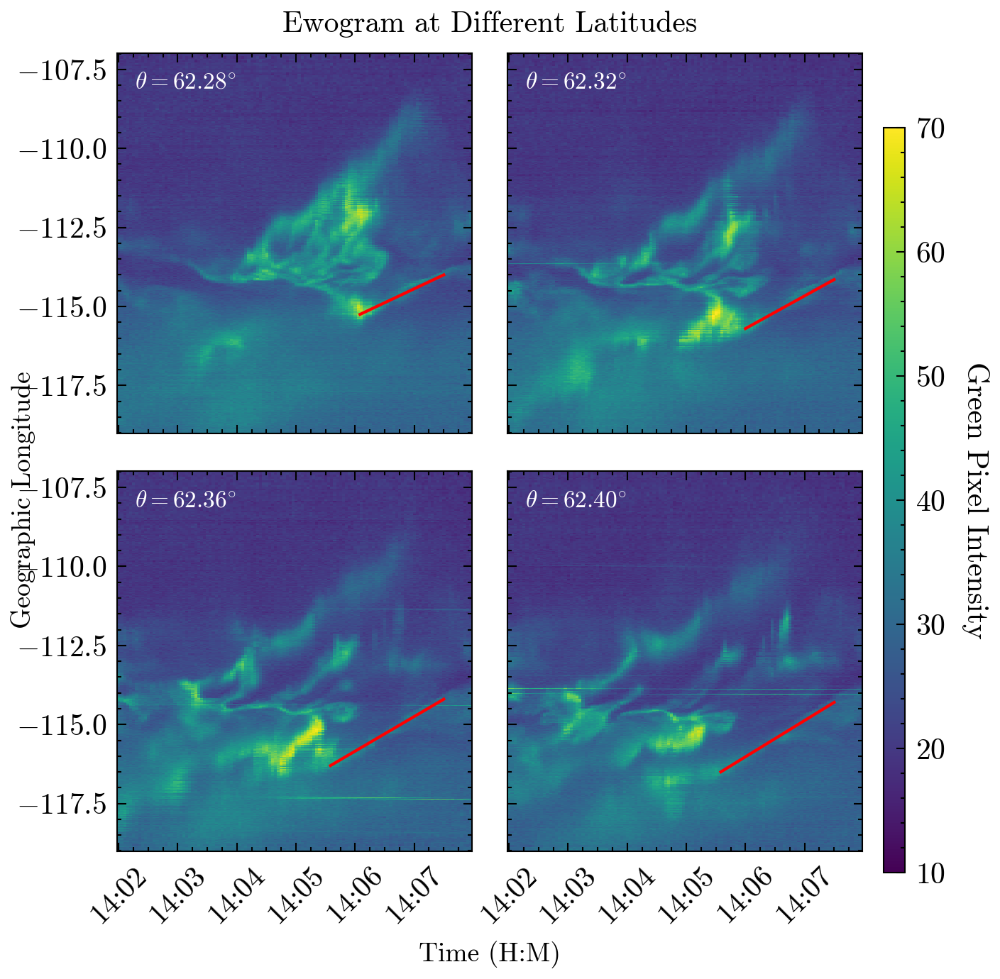

In [698]:
import matplotlib.dates as mdates

# Create the figure and subplots with further reduced white space
fig, ax = plt.subplots(figsize=(5,5), dpi=300, nrows=2, ncols=2, sharex=True, sharey=True)

# Plot the data
ax[0][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_30, 1, 0 )[:,:,1], vmin=10, vmax=70)
ax[0][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_32, 1, 0 )[:,:,1], vmin=10, vmax=70)
ax[1][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_34, 1, 0 )[:,:,1], vmin=10, vmax=70)
im = ax[1][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_36, 1, 0 )[:,:,1], vmin=10, vmax=70)

# Adjust subplot parameters to minimize white space even more
fig.subplots_adjust(left=0.15, right=0.85, top=0.92, bottom=0.17, hspace=0.1, wspace=0.1)

# Adjust colorbar positioning (narrower and closer to subplots)
cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Green Pixel Intensity', rotation=-90, labelpad=15 ) 
# Set x-axis formatters
locator = mdates.MinuteLocator(interval=1)  # Shows every minute
formatter = mdates.DateFormatter('%H:%M')

for axes in ax.flat:
    axes.xaxis.set_major_locator(locator)
    axes.xaxis.set_major_formatter(formatter)
    axes.tick_params(axis='x', rotation=45)

# Set titles and labels
fig.suptitle("Ewogram at Different Latitudes", fontsize=10, y=0.96)  # Title closer to subplots
fig.supxlabel(r"Time (H:M)", fontsize=9, y=0.06)  # X label closer to bottom
fig.supylabel(r"Geographic Longitude", fontsize=9, x=0.05)  # Y label closer to left

# Add text labels to each subplot with minimal spacing
latitudes = [62.28, 62.32, 62.36, 62.40]
ax[0][0].text(0.05, 0.95, f"$\\theta={latitudes[0]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][0].transAxes, color='white', fontsize=8)
ax[0][1].text(0.05, 0.95, f"$\\theta={latitudes[1]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][1].transAxes, color='white', fontsize=8)
ax[1][0].text(0.05, 0.95, f"$\\theta={latitudes[2]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][0].transAxes, color='white', fontsize=8)
ax[1][1].text(0.05, 0.95, f"$\\theta={latitudes[3]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][1].transAxes, color='white', fontsize=8)

#ax1

start_datetime = pd.Timestamp('2022-12-19 14:06:05')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.25
end_longitude = -114.0
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.28, -115.3)  
coord2 = (62.28, -114.0)   

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers




# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][0].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax2
start_datetime = pd.Timestamp('2022-12-19 14:06')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.7
end_longitude = -114.15
coord1 = (62.32, start_longitude)  # Los Angeles, CA
coord2 = (62.32, end_longitude )   # New York, NY

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][1].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax3
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.3
end_longitude = -114.2
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.36, start_longitude)  # Los Angeles, CA
coord2 = (62.36, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][0].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax4
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.5
end_longitude = -114.3
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)
coord1 = (62.4, start_longitude)  # Los Angeles, CA
coord2 = (62.4, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][1].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")


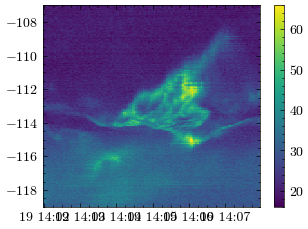

In [699]:
plt.pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_30, 1, 0 )[:,:,1])
plt.colorbar()

In [700]:
"""
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
plt.pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_3, 1, 0 )[:,:,1])
#plt.contour(time_ewo, x_1,np.swapaxes(pixel_closest_1, 1, 0 )[:,:,1], 6, colors='k')
y = pd.date_range(start='2022-12-19 14:05:00', end='2022-12-19 14:05:55', periods=100).tolist()
print(y)
plt.plot(y, np.linspace(-114.1,-112.7, 100), color='red')
import geopy.distance
coords_1=(61.36, -114.1)
coords_2=(61.36, -112.7)
print(geopy.distance.geodesic(coords_1, coords_2).km)

print(geopy.distance.geodesic(coords_1, coords_2).km/(55))

y = pd.date_range(start='2022-12-19 14:04:05', end='2022-12-19 14:04:23', periods=100).tolist()
print(y)
plt.plot(y, np.linspace(-113.85,-113.6, 100), color='red')
import geopy.distance
coords_1=(61.36, -113.85)
coords_2=(61.36, -113.6)
print(geopy.distance.geodesic(coords_1, coords_2).km)

print(geopy.distance.geodesic(coords_1, coords_2).km/(18))

y = pd.date_range(start='2022-12-19 14:04:45', end='2022-12-19 14:05:25', periods=100).tolist()
print(y)
plt.plot(y, np.linspace(-116.2,-115, 100), color='red')
import geopy.distance
coords_1=(61.36, -116.2)
coords_2=(61.36, -115)
print(geopy.distance.geodesic(coords_1, coords_2).km)

print(geopy.distance.geodesic(coords_1, coords_2).km/(40))
"""

"\nfig, ax = plt.subplots(figsize=(6,6), dpi=300)\nplt.pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_3, 1, 0 )[:,:,1])\n#plt.contour(time_ewo, x_1,np.swapaxes(pixel_closest_1, 1, 0 )[:,:,1], 6, colors='k')\ny = pd.date_range(start='2022-12-19 14:05:00', end='2022-12-19 14:05:55', periods=100).tolist()\nprint(y)\nplt.plot(y, np.linspace(-114.1,-112.7, 100), color='red')\nimport geopy.distance\ncoords_1=(61.36, -114.1)\ncoords_2=(61.36, -112.7)\nprint(geopy.distance.geodesic(coords_1, coords_2).km)\n\nprint(geopy.distance.geodesic(coords_1, coords_2).km/(55))\n\ny = pd.date_range(start='2022-12-19 14:04:05', end='2022-12-19 14:04:23', periods=100).tolist()\nprint(y)\nplt.plot(y, np.linspace(-113.85,-113.6, 100), color='red')\nimport geopy.distance\ncoords_1=(61.36, -113.85)\ncoords_2=(61.36, -113.6)\nprint(geopy.distance.geodesic(coords_1, coords_2).km)\n\nprint(geopy.distance.geodesic(coords_1, coords_2).km/(18))\n\ny = pd.date_range(start='2022-12-19 14:04:45', end='2022-12-19 1

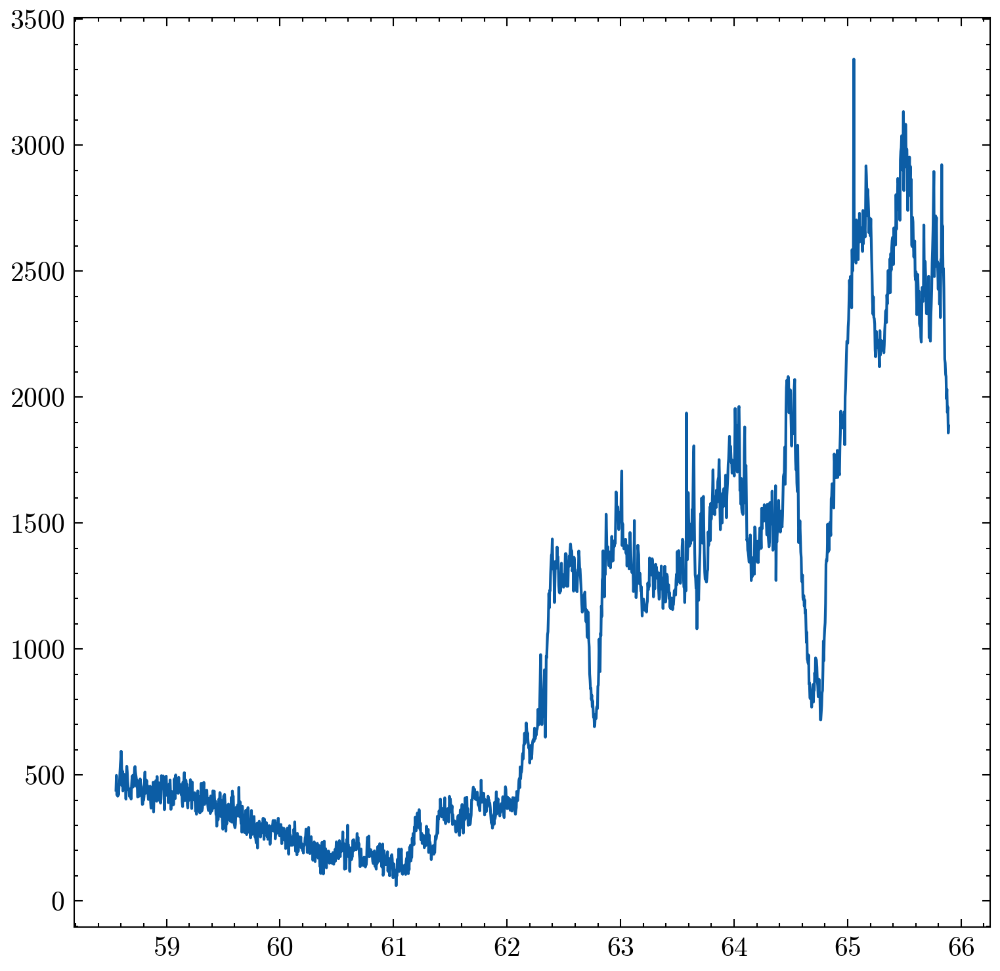

In [701]:
sat_lla_E[0]
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
plt.plot(sat_lla_E[0], [np.sqrt(VNEC[x,0]**2+VNEC[x,1]**2+VNEC[x,2]**2) for x in range(len(VNEC))])

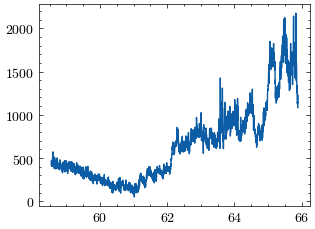

In [702]:
plt.plot(sat_lla_E[0], [np.sqrt(VNEC[x,0]**2) for x in range(len(VNEC))])

TREX_RGB YKNF keogram: |################################################| 100%


(<Axes: title={'center': '2022-12-19 | TREX_RGB-YKNF keogram'}>,
 <matplotlib.collections.QuadMesh at 0x2003661fcd0>)

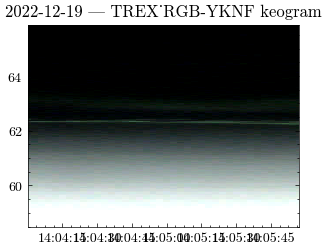

In [703]:
asi.plot_keogram()

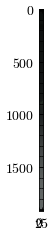

In [704]:
plt.imshow(np.swapaxes(pixel_closest_sat, 1, 0 ))

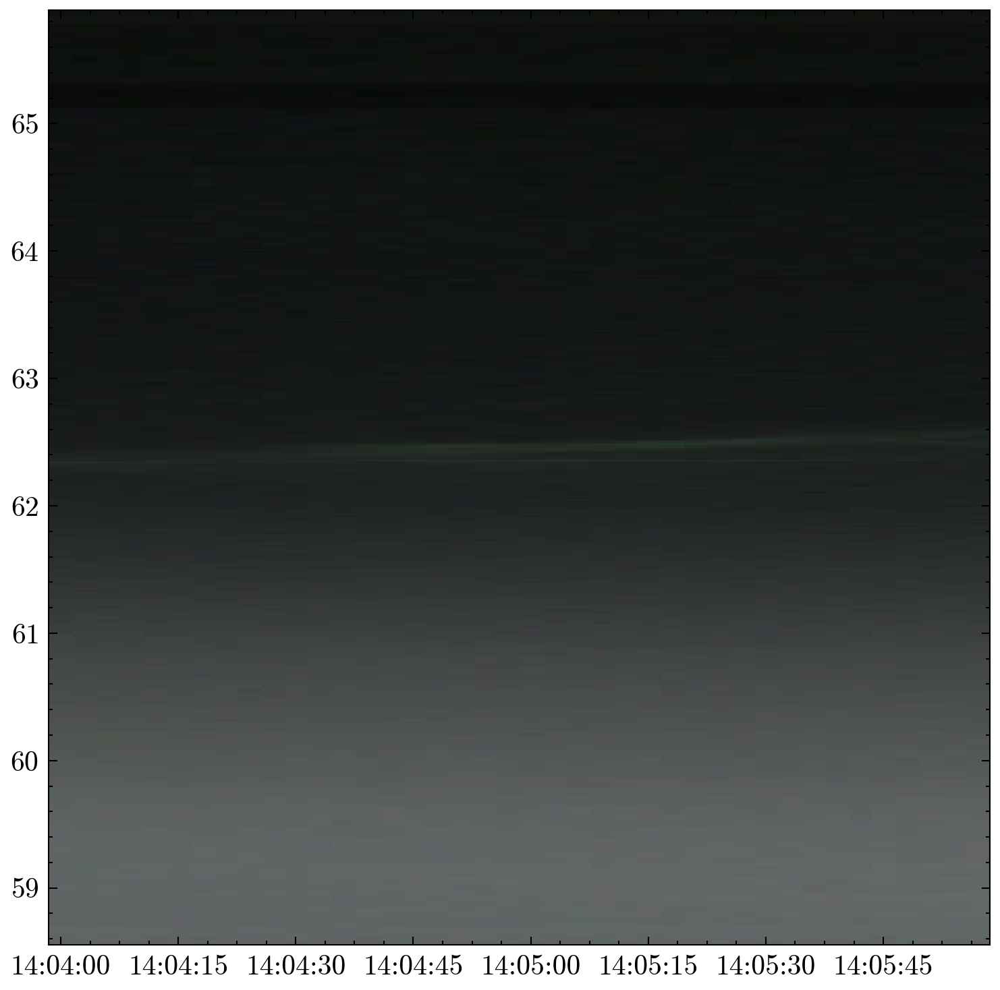

In [705]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300)

plt.pcolormesh( time_sat_keo, sat_lla_E[0], np.swapaxes(pixel_closest_sat, 1, 0 ))

(120,)


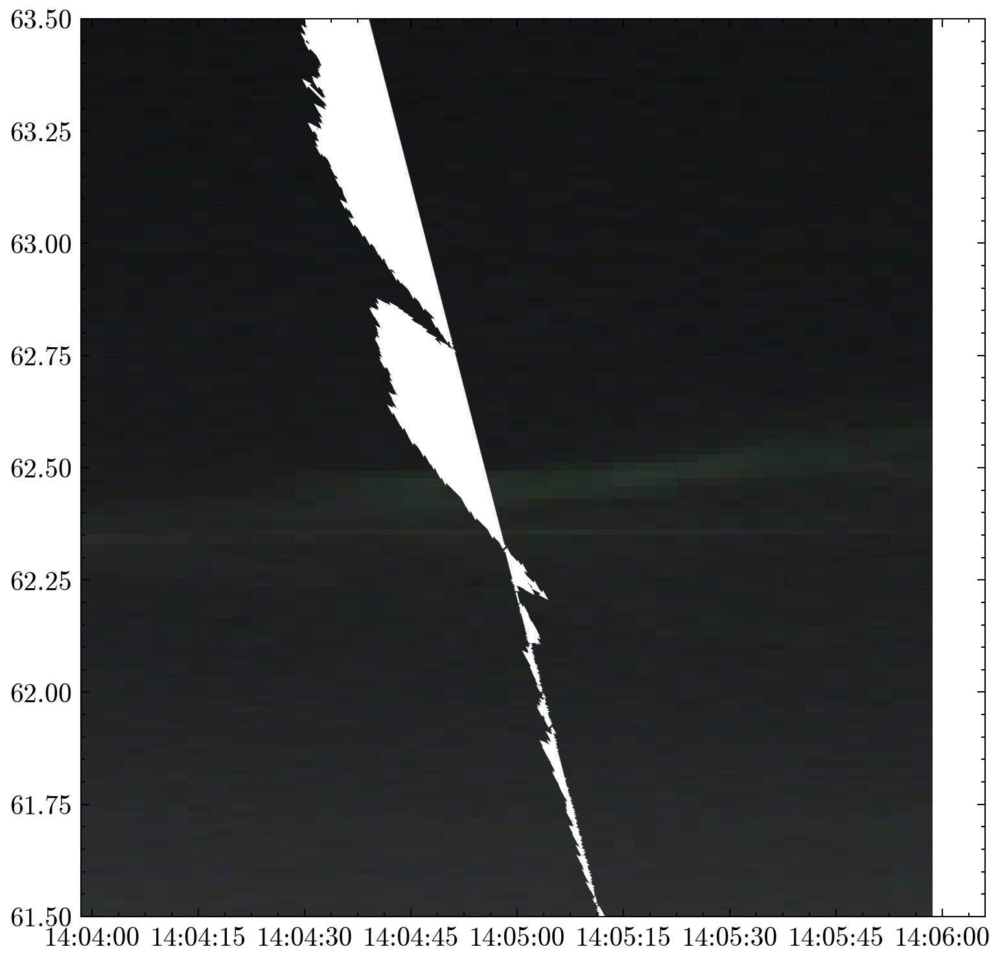

In [706]:
print(np.shape(time_ewo))
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
plt.pcolormesh( time_sat_keo, sat_lla_E[0], np.swapaxes(pixel_closest_sat, 1, 0 ))
plt.ylim(61.5,63.5)


from scipy.interpolate import CubicSpline
cs = CubicSpline(Btime, sat_lla_B[0])
latitudes_16sps = cs(Etime)
cs = CubicSpline(Btime, BNEC[:,0])
Bs_16sps = cs(Etime)
U_perpendicular = -VNEC[:, 1] / np.max(np.abs(VNEC[:, 1]))  # Inverting y-component for perpendicular direction
V_perpendicular = VNEC[:, 1] / np.max(np.abs(VNEC[:, 1]))   # Keeping the x-component

plt.quiver( Etime,sat_lla_E[0], U_perpendicular, V_perpendicular, color='white', scale=1, scale_units='inches')




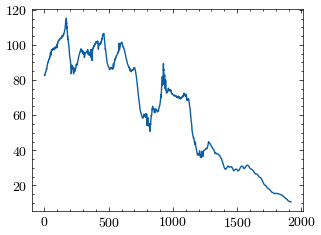

In [707]:
plt.plot( Bs_16sps)

Now lets make an ewogram

In [708]:
lat16 = sat_lla_E[0]
lat50 = sat_lla_B[0]

In [709]:
print(len(indicies_sat))
alongtrackpixel=[]
lats_used=[]
for i in range(len(indicies_sat)):
    for k in range(len(indicies_sat[i])):
        print(pixel_closest_sat[i][k])
        alongtrackpixel.append(pixel_closest_sat_track[i][k])
        lats_used.append(lats[i][k])
alongtrackpixel = np.array(alongtrackpixel, dtype=np.uint8)
print(alongtrackpixel[:, 1])

40
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[15 17 17]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[17 19 20]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[13 16 13]
[14 14 13]
[14 14 13]
[14 14 13]
[14 14 13]
[14 14 13]
[14 14 13]
[14 14 13]
[14 14 13]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[12 18 14]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[16 19 16]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[13 17 12]
[15 15 15]
[15 15 15]
[15 15 

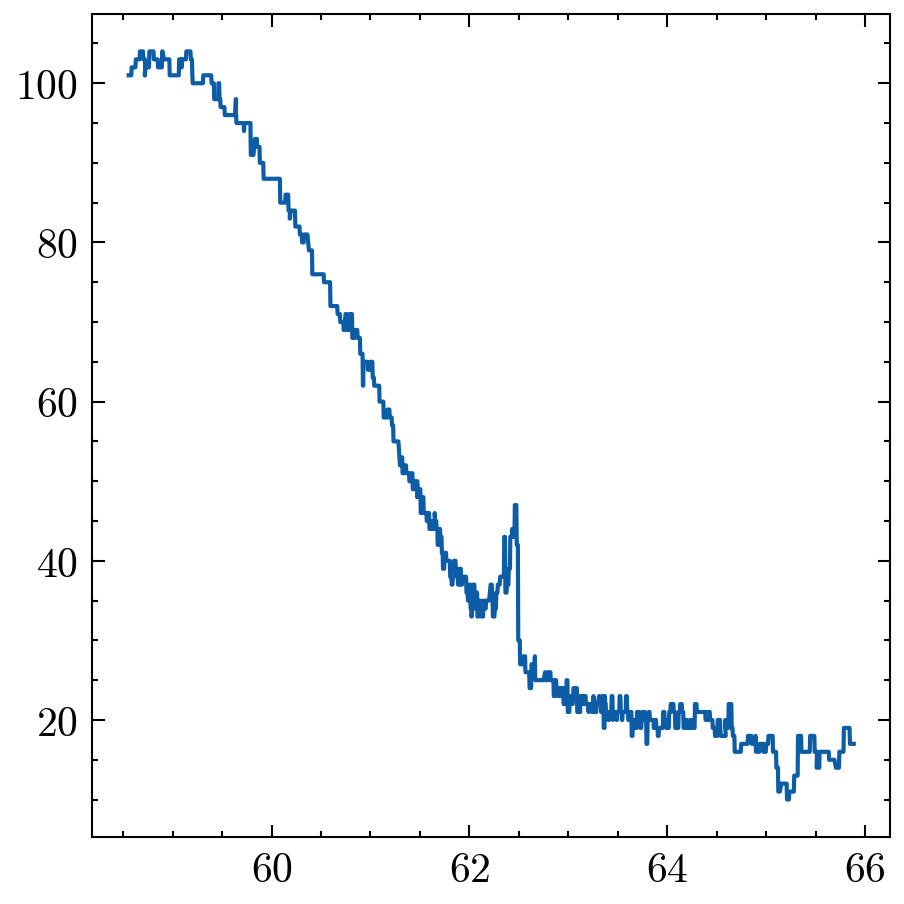

In [710]:
fig, axes = plt.subplots(figsize=(3, 3), dpi=300, constrained_layout=True, sharex=True)
plt.plot(lats_used, alongtrackpixel[:, 1], label="Satellite Track Intensity")

We want our plots to have lat verus data


(120, 3)


C:\Users\1101w\AppData\Local\Temp\ipykernel_14124\476393335.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)


(10.0, 60.0)

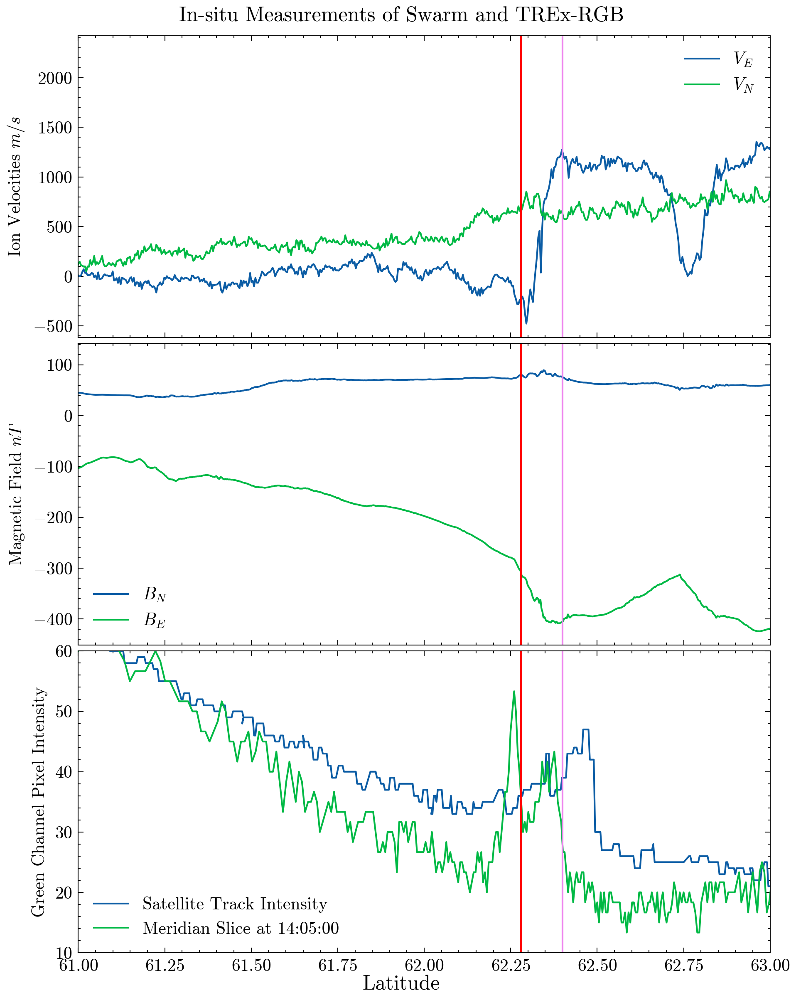

In [711]:
fig, axes = plt.subplots(figsize=(6,8), nrows=3, dpi=300, constrained_layout=True, sharex=True)
#We want B east and north, then E north and East and then the pixel intensity of the satellite and the pixel intensity of the keogram
axes[0].plot(lat16, VNEC[:, 1], label=r"$V_{E}$")
#Vtwin=axes[0].twinx()
axes[0].plot(lat16,VNEC[:,0], label=r"$V_{N}$")




#Btwin=axes[2].twinx()
axes[1].plot(lat50,BNEC[:,0], label=r"$B_{N}$")
axes[1].plot(lat50, BNEC[:, 1], label=r"$B_{E}$")
print(np.shape(area_intensity))

axes[2].plot(lats_used, alongtrackpixel[:, 1], label="Satellite Track Intensity")

axes[2].plot(im_good.get_coordinates()[:, 240, 1][:-1], im_good.get_array()[:, 240, 0]*100+10, label="Meridian Slice at 14:05:00") #change colors



plt.suptitle("In-situ Measurements of Swarm and TREx-RGB", y=1)
fig.supxlabel("Latitude")

axes[0].legend()
axes[1].legend()
axes[2].legend()

plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)

axes[0].set_ylabel(r"Ion Velocities $m/s$")
axes[1].set_ylabel(r"Magnetic Field $nT$")
axes[2].set_ylabel(r"Green Channel Pixel Intensity")

axes[0].set_xlim(61, 63)
axes[1].set_xlim(61, 63)
axes[2].set_xlim(61, 63)

axes[0].axvline(62.28, color='red')
axes[1].axvline(62.28, color='red')
axes[2].axvline(62.28, color='red')

axes[0].axvline(62.4, color='violet')
axes[1].axvline(62.4, color='violet')
axes[2].axvline(62.4, color='violet')
axes[2].set_ylim(10,60)



Doesn't line up because the arc doesnt follow magnetic latitude, its more aligned east west due to the convection flow shape

In [712]:
import numpy as np
import datetime

# Example array of Python datetime objects
datetime_array = np.array([
    datetime.datetime(2024, 8, 10, 12, 0),
    datetime.datetime(2024, 8, 11, 12, 0),
    datetime.datetime(2024, 8, 12, 12, 0),
    datetime.datetime(2024, 8, 13, 12, 0),
    datetime.datetime(2024, 8, 14, 12, 0)
])

# Given start and end datetimes
start_datetime = datetime.datetime(2024, 8, 11, 0, 0)
end_datetime = datetime.datetime(2024, 8, 13, 0, 0)

# Find the indices where datetime_array is between start_datetime and end_datetime
indices = np.where((datetime_array >= start_datetime) & (datetime_array <= end_datetime))[0]

print(indices)

[1 2]


Now we want to do a bandpass filter for the above electrodynamics data so we can differeinate between large and small scale. We will do a variety of filters so we can choose one that looks good. We will do 0.05Hz, 0.1Hz, 0.2Hz, 0.5Hz to 6Hz

In [713]:
from scipy.signal import butter, filtfilt

def butter_bandpass(cutoffs, fs, order=4):
    if cutoffs[0] ==0:
        return butter(order, cutoffs[1], fs=fs, btype="low")
    else:
        return butter(order, cutoffs, fs=fs, btype="band")


def butter_bandpass_filter(data, cutoffs, fs, order=4):
    b, a = butter_bandpass(cutoffs, fs, order=order)
    y = filtfilt(b, a, data)
    return y

In [714]:
V005,V01,V02,V05= np.zeros((np.shape(VNEC))), np.zeros((np.shape(VNEC))), np.zeros((np.shape(VNEC))), np.zeros((np.shape(VNEC)))
E005,E01,E02,E05 = np.zeros((np.shape(ENEC))), np.zeros((np.shape(ENEC))), np.zeros((np.shape(ENEC))), np.zeros((np.shape(ENEC)))
B005,B01,B02,B05 = np.zeros((np.shape(BNEC))), np.zeros((np.shape(BNEC))), np.zeros((np.shape(BNEC))), np.zeros((np.shape(BNEC)))
for i in range(3):
    V005[:, i]=butter_bandpass_filter(VNEC[:, i], [0.05, 6], 16)
    V01[:, i]=butter_bandpass_filter(VNEC[:, i], [0.1, 6], 50)
    V02[:, i]=butter_bandpass_filter(VNEC[:, i], [0.2, 6], 50)
    V05[:, i]=butter_bandpass_filter(VNEC[:, i], [0.5, 6], 50)

    E005[:, i]=butter_bandpass_filter(ENEC[:, i], [0.05, 6], 16)
    E01[:, i]=butter_bandpass_filter(ENEC[:, i], [0.1, 6], 16)
    E02[:, i]=butter_bandpass_filter(ENEC[:, i], [0.2, 6], 16)
    E05[:, i]=butter_bandpass_filter(ENEC[:, i], [0.5, 6], 16)


    B005[:, i]=butter_bandpass_filter(BNEC[:, i], [0.05, 6], 50)
    B01[:, i]=butter_bandpass_filter(BNEC[:, i], [0.1, 6], 50)
    B02[:, i]=butter_bandpass_filter(BNEC[:, i], [0.2, 6], 50)
    B05[:, i]=butter_bandpass_filter(BNEC[:, i], [0.5, 6], 50)

(120, 3)


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (40,) + inhomogeneous part.

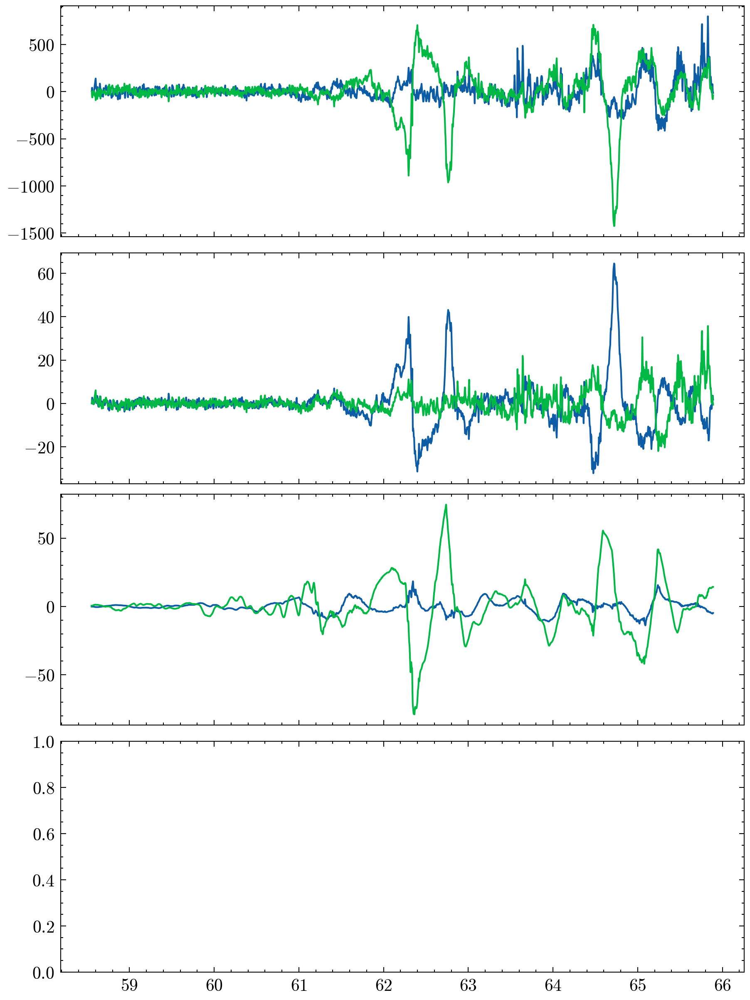

In [715]:
fig, axes = plt.subplots(figsize=(6,8), nrows=4, dpi=300, constrained_layout=True, sharex=True)
#We want B east and north, then E north and East and then the pixel intensity of the satellite and the pixel intensity of the keogram
axes[0].plot(lat16, V005[:,0], label=r"$V_{N}$")
axes[0].plot(lat16, V005[:, 1], label=r"$V_{E}$")
axes[1].plot(lat16, E005[:,0], label=r"$E_{N}$")
axes[1].plot(lat16, E005[:, 1], label=r"$E_{E}$")
axes[2].plot(lat50,B005[:,0], label=r"$B_{N}$")
axes[2].plot(lat50, B005[:, 1], label=r"$B_{E}$")
print(np.shape(area_intensity))
axes[3].plot(lats,pixel_closest_sat_track, label="Satellite Track Intensity")
axes[3].plot(im.get_coordinates()[:, 60, 1][:-1], im.get_array()[:, 60, 0], label="Meridian Slice at 14:05:00") #change colors



plt.suptitle("In-situ Measurements of Swarm and TREx-RGB", y=1)
fig.supxlabel("Latitude")

axes[0].legend()
axes[1].legend()
axes[2].legend()
axes[3].legend()
plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)

axes[0].set_ylabel(r"Ion Velocities $m/s$")
axes[1].set_ylabel(r"Electric Field $mV/m$")
axes[2].set_ylabel(r"Magnetic Field $nT$")
axes[3].set_ylabel(r"Green Channel Pixel Intensity")

axes[0].set_xlim(59, 65.6)
axes[1].set_xlim(59, 65.6)
axes[2].set_xlim(59, 65.6)
axes[3].set_xlim(59, 65.6)

(40, 3)


C:\Users\1101w\AppData\Local\Temp\ipykernel_19608\1583218909.py:23: UserWarning: The figure layout has changed to tight
  plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)


(59.0, 65.6)

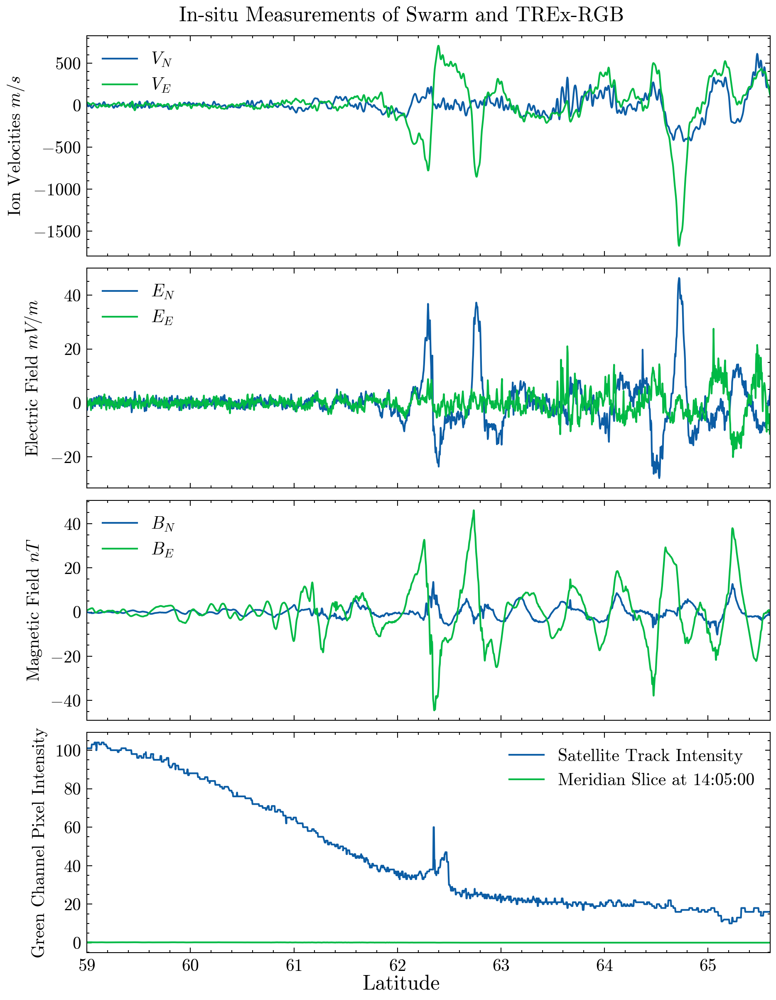

In [142]:
fig, axes = plt.subplots(figsize=(6,8), nrows=4, dpi=300, constrained_layout=True, sharex=True)
#We want B east and north, then E north and East and then the pixel intensity of the satellite and the pixel intensity of the keogram
axes[0].plot(lat16, V01[:,0], label=r"$V_{N}$")
axes[0].plot(lat16, V01[:, 1], label=r"$V_{E}$")
axes[1].plot(lat16, E01[:,0], label=r"$E_{N}$")
axes[1].plot(lat16, E01[:, 1], label=r"$E_{E}$")
axes[2].plot(lat50,B01[:,0], label=r"$B_{N}$")
axes[2].plot(lat50, B01[:, 1], label=r"$B_{E}$")
print(np.shape(area_intensity))
axes[3].plot(lats, pixel_chosen_array, label="Satellite Track Intensity")
axes[3].plot(im.get_coordinates()[:, 60, 1][:-1], im.get_array()[:, 60, 0], label="Meridian Slice at 14:05:00") #change colors




plt.suptitle("In-situ Measurements of Swarm and TREx-RGB", y=1)
fig.supxlabel("Latitude")

axes[0].legend()
axes[1].legend()
axes[2].legend()
axes[3].legend()
plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)

axes[0].set_ylabel(r"Ion Velocities $m/s$")
axes[1].set_ylabel(r"Electric Field $mV/m$")
axes[2].set_ylabel(r"Magnetic Field $nT$")
axes[3].set_ylabel(r"Green Channel Pixel Intensity")

axes[0].set_xlim(59, 65.6)
axes[1].set_xlim(59, 65.6)
axes[2].set_xlim(59, 65.6)
axes[3].set_xlim(59, 65.6)

(40, 3)


C:\Users\1101w\AppData\Local\Temp\ipykernel_19608\2505789916.py:42: UserWarning: The figure layout has changed to tight
  plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)


(59.0, 65.6)

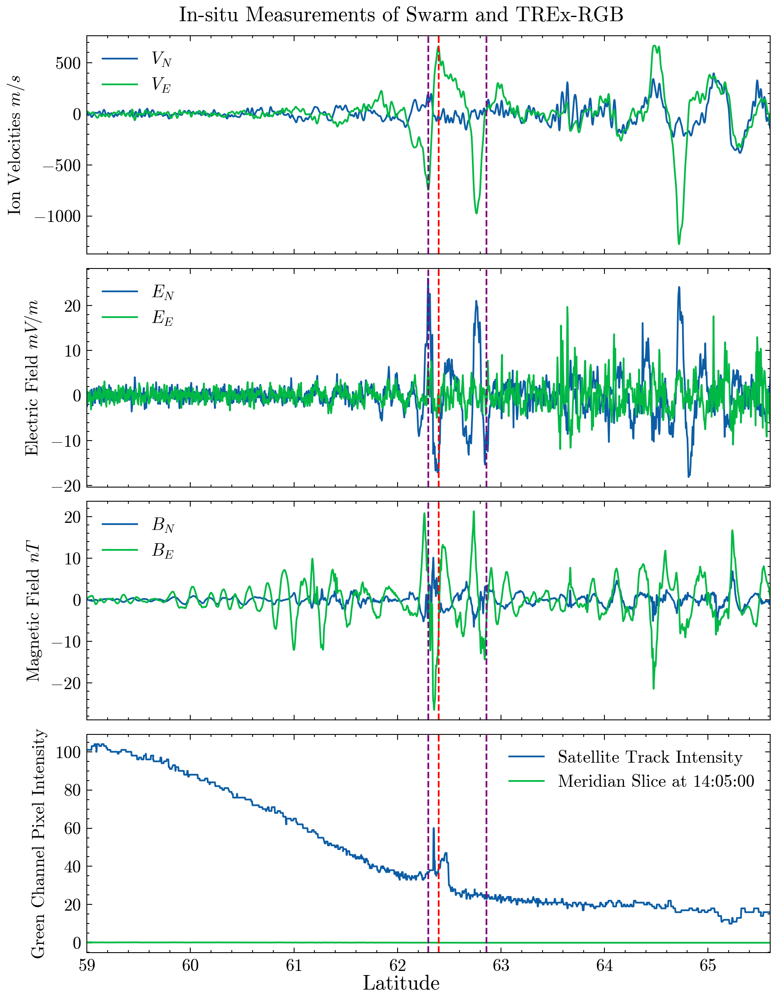

In [143]:
fig, axes = plt.subplots(figsize=(6,8), nrows=4, dpi=300, constrained_layout=True, sharex=True)
#We want B east and north, then E north and East and then the pixel intensity of the satellite and the pixel intensity of the keogram
axes[0].plot(lat16, V02[:,0], label=r"$V_{N}$")
axes[0].plot(lat16, V02[:, 1], label=r"$V_{E}$")
axes[1].plot(lat16, E02[:,0], label=r"$E_{N}$")
axes[1].plot(lat16, E02[:, 1], label=r"$E_{E}$")
axes[2].plot(lat50,B02[:,0], label=r"$B_{N}$")
axes[2].plot(lat50, B02[:, 1], label=r"$B_{E}$")
print(np.shape(area_intensity))
axes[3].plot(lats, pixel_chosen_array, label="Satellite Track Intensity")
axes[3].plot(im.get_coordinates()[:, 60, 1][:-1], im.get_array()[:, 60, 0], label="Meridian Slice at 14:05:00") #change colors

axes[0].axvline(62.4, linestyle='dashed', color='red') #change color
axes[1].axvline(62.4, linestyle='dashed', color='red') #change color
axes[2].axvline(62.4, linestyle='dashed', color='red') #change color
axes[3].axvline(62.4, linestyle='dashed', color='red') #change color






axes[0].axvline(62.3, linestyle='dashed', color='purple') #change color
axes[1].axvline(62.3, linestyle='dashed', color='purple') #change color
axes[2].axvline(62.3, linestyle='dashed', color='purple') #change color
axes[3].axvline(62.3, linestyle='dashed', color='purple') #change color


axes[0].axvline(62.86, linestyle='dashed', color='purple') #change color
axes[1].axvline(62.86, linestyle='dashed', color='purple') #change color
axes[2].axvline(62.86, linestyle='dashed', color='purple') #change color
axes[3].axvline(62.86, linestyle='dashed', color='purple') #change color


plt.suptitle("In-situ Measurements of Swarm and TREx-RGB", y=1)
fig.supxlabel("Latitude")

axes[0].legend()
axes[1].legend()
axes[2].legend()
axes[3].legend()
plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)

axes[0].set_ylabel(r"Ion Velocities $m/s$")
axes[1].set_ylabel(r"Electric Field $mV/m$")
axes[2].set_ylabel(r"Magnetic Field $nT$")
axes[3].set_ylabel(r"Green Channel Pixel Intensity")

axes[0].set_xlim(59, 65.6)
axes[1].set_xlim(59, 65.6)
axes[2].set_xlim(59, 65.6)
axes[3].set_xlim(59, 65.6)

(40, 3)


C:\Users\1101w\AppData\Local\Temp\ipykernel_19608\817563030.py:42: UserWarning: The figure layout has changed to tight
  plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)


(59.0, 65.6)

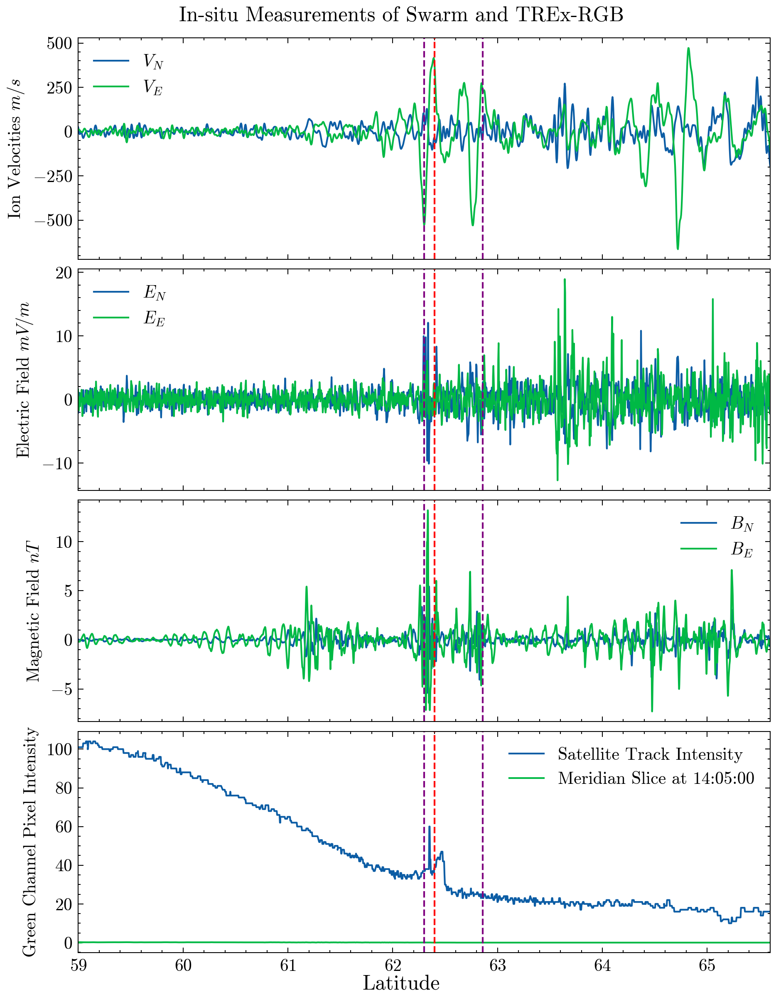

In [144]:
fig, axes = plt.subplots(figsize=(6,8), nrows=4, dpi=300, constrained_layout=True, sharex=True)
#We want B east and north, then E north and East and then the pixel intensity of the satellite and the pixel intensity of the keogram
axes[0].plot(lat16, V05[:,0], label=r"$V_{N}$")
axes[0].plot(lat16, V05[:, 1], label=r"$V_{E}$")
axes[1].plot(lat16, E05[:,0], label=r"$E_{N}$")
axes[1].plot(lat16, E05[:, 1], label=r"$E_{E}$")
axes[2].plot(lat50,B05[:,0], label=r"$B_{N}$")
axes[2].plot(lat50, B05[:, 1], label=r"$B_{E}$")
print(np.shape(area_intensity))
axes[3].plot(lats, pixel_chosen_array, label="Satellite Track Intensity")
axes[3].plot(im.get_coordinates()[:, 60, 1][:-1], im.get_array()[:, 60, 0], label="Meridian Slice at 14:05:00") #change colors

axes[0].axvline(62.4, linestyle='dashed', color='red') #change color
axes[1].axvline(62.4, linestyle='dashed', color='red') #change color
axes[2].axvline(62.4, linestyle='dashed', color='red') #change color
axes[3].axvline(62.4, linestyle='dashed', color='red') #change color






axes[0].axvline(62.3, linestyle='dashed', color='purple') #change color
axes[1].axvline(62.3, linestyle='dashed', color='purple') #change color
axes[2].axvline(62.3, linestyle='dashed', color='purple') #change color
axes[3].axvline(62.3, linestyle='dashed', color='purple') #change color


axes[0].axvline(62.86, linestyle='dashed', color='purple') #change color
axes[1].axvline(62.86, linestyle='dashed', color='purple') #change color
axes[2].axvline(62.86, linestyle='dashed', color='purple') #change color
axes[3].axvline(62.86, linestyle='dashed', color='purple') #change color


plt.suptitle("In-situ Measurements of Swarm and TREx-RGB", y=1)
fig.supxlabel("Latitude")

axes[0].legend()
axes[1].legend()
axes[2].legend()
axes[3].legend()
plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=0.35)

axes[0].set_ylabel(r"Ion Velocities $m/s$")
axes[1].set_ylabel(r"Electric Field $mV/m$")
axes[2].set_ylabel(r"Magnetic Field $nT$")
axes[3].set_ylabel(r"Green Channel Pixel Intensity")

axes[0].set_xlim(59, 65.6)
axes[1].set_xlim(59, 65.6)
axes[2].set_xlim(59, 65.6)
axes[3].set_xlim(59, 65.6)